In [15]:
import numpy as np, matplotlib.pyplot as plt
from functools import partial
from scipy.optimize import curve_fit
from scipy.special import factorial

In [16]:
# Cross-sections for water (better collapsed)
Photon_Energy = []
Incoher_Scatter = []
Photoel_Absorb = []
Tot_wo_Coherent = []
data = '''1.000E-03 1.319E-02 4.076E+03 4.076E+03 
2.000E-03 4.184E-02 6.162E+02 6.162E+02 
3.000E-03 7.075E-02 1.919E+02 1.919E+02 
4.000E-03 9.430E-02 8.197E+01 8.207E+01 
5.000E-03 1.123E-01 4.192E+01 4.203E+01 
6.000E-03 1.259E-01 2.407E+01 2.419E+01 
7.000E-03 1.361E-01 1.499E+01 1.513E+01 
8.000E-03 1.440E-01 9.919E+00 1.006E+01 
9.000E-03 1.501E-01 6.875E+00 7.025E+00 
1.000E-02 1.550E-01 4.944E+00 5.099E+00 
1.100E-02 1.591E-01 3.664E+00 3.823E+00 
1.200E-02 1.624E-01 2.783E+00 2.946E+00 
1.300E-02 1.653E-01 2.160E+00 2.325E+00 
1.400E-02 1.678E-01 1.706E+00 1.874E+00 
1.500E-02 1.699E-01 1.369E+00 1.539E+00 
1.600E-02 1.718E-01 1.114E+00 1.286E+00 
1.700E-02 1.735E-01 9.174E-01 1.091E+00 
1.800E-02 1.749E-01 7.636E-01 9.385E-01 
1.900E-02 1.762E-01 6.417E-01 8.179E-01 
2.000E-02 1.774E-01 5.439E-01 7.213E-01 
2.100E-02 1.783E-01 4.646E-01 6.430E-01 
2.200E-02 1.792E-01 3.997E-01 5.789E-01 
2.300E-02 1.800E-01 3.461E-01 5.261E-01 
2.400E-02 1.806E-01 3.015E-01 4.821E-01 
2.500E-02 1.812E-01 2.640E-01 4.452E-01 
2.600E-02 1.817E-01 2.324E-01 4.141E-01 
2.700E-02 1.821E-01 2.055E-01 3.876E-01 
2.800E-02 1.824E-01 1.826E-01 3.650E-01 
2.900E-02 1.827E-01 1.628E-01 3.455E-01 
3.000E-02 1.829E-01 1.458E-01 3.286E-01 
3.100E-02 1.830E-01 1.309E-01 3.140E-01 
3.200E-02 1.831E-01 1.180E-01 3.012E-01 
3.300E-02 1.832E-01 1.067E-01 2.899E-01 
3.400E-02 1.832E-01 9.679E-02 2.800E-01 
3.500E-02 1.832E-01 8.802E-02 2.713E-01 
3.600E-02 1.832E-01 8.026E-02 2.635E-01 
3.700E-02 1.831E-01 7.336E-02 2.565E-01 
3.800E-02 1.830E-01 6.722E-02 2.502E-01 
3.900E-02 1.829E-01 6.172E-02 2.446E-01 
4.000E-02 1.827E-01 5.680E-02 2.395E-01 
4.100E-02 1.826E-01 5.237E-02 2.349E-01 
4.200E-02 1.824E-01 4.838E-02 2.308E-01 
4.300E-02 1.822E-01 4.478E-02 2.269E-01 
4.400E-02 1.819E-01 4.152E-02 2.235E-01 
4.500E-02 1.817E-01 3.856E-02 2.203E-01 
4.600E-02 1.814E-01 3.587E-02 2.173E-01 
4.700E-02 1.812E-01 3.341E-02 2.146E-01 
4.800E-02 1.809E-01 3.117E-02 2.121E-01 
4.900E-02 1.806E-01 2.913E-02 2.097E-01 
5.000E-02 1.803E-01 2.725E-02 2.076E-01 
5.100E-02 1.800E-01 2.553E-02 2.055E-01 
5.200E-02 1.797E-01 2.394E-02 2.037E-01 
5.300E-02 1.794E-01 2.248E-02 2.019E-01 
5.400E-02 1.791E-01 2.114E-02 2.002E-01 
5.500E-02 1.787E-01 1.990E-02 1.986E-01 
5.600E-02 1.784E-01 1.875E-02 1.972E-01 
5.700E-02 1.781E-01 1.768E-02 1.957E-01 
5.800E-02 1.777E-01 1.669E-02 1.944E-01 
5.900E-02 1.774E-01 1.578E-02 1.932E-01 
6.000E-02 1.770E-01 1.493E-02 1.920E-01 
6.100E-02 1.767E-01 1.413E-02 1.908E-01 
6.200E-02 1.763E-01 1.339E-02 1.897E-01 
6.300E-02 1.760E-01 1.270E-02 1.887E-01 
6.400E-02 1.756E-01 1.206E-02 1.877E-01 
6.500E-02 1.752E-01 1.146E-02 1.867E-01 
6.600E-02 1.749E-01 1.089E-02 1.858E-01 
6.700E-02 1.745E-01 1.037E-02 1.849E-01 
6.800E-02 1.741E-01 9.871E-03 1.840E-01 
6.900E-02 1.738E-01 9.406E-03 1.832E-01 
7.000E-02 1.734E-01 8.969E-03 1.824E-01 
7.100E-02 1.730E-01 8.559E-03 1.816E-01 
7.200E-02 1.727E-01 8.172E-03 1.808E-01 
7.300E-02 1.723E-01 7.808E-03 1.801E-01 
7.400E-02 1.719E-01 7.465E-03 1.794E-01 
7.500E-02 1.716E-01 7.141E-03 1.787E-01 
7.600E-02 1.712E-01 6.835E-03 1.780E-01 
7.700E-02 1.708E-01 6.546E-03 1.774E-01 
7.800E-02 1.705E-01 6.273E-03 1.767E-01 
7.900E-02 1.701E-01 6.015E-03 1.761E-01 
8.000E-02 1.697E-01 5.770E-03 1.755E-01 
8.100E-02 1.694E-01 5.538E-03 1.749E-01 
8.200E-02 1.690E-01 5.318E-03 1.743E-01 
8.300E-02 1.686E-01 5.109E-03 1.737E-01 
8.400E-02 1.683E-01 4.911E-03 1.732E-01 
8.500E-02 1.679E-01 4.723E-03 1.726E-01 
8.600E-02 1.675E-01 4.544E-03 1.721E-01 
8.700E-02 1.672E-01 4.374E-03 1.716E-01 
8.800E-02 1.668E-01 4.212E-03 1.710E-01 
8.900E-02 1.665E-01 4.058E-03 1.705E-01 
9.000E-02 1.661E-01 3.911E-03 1.700E-01 
9.100E-02 1.658E-01 3.771E-03 1.695E-01 
9.200E-02 1.654E-01 3.637E-03 1.690E-01 
9.300E-02 1.650E-01 3.510E-03 1.686E-01 
9.400E-02 1.647E-01 3.388E-03 1.681E-01 
9.500E-02 1.643E-01 3.272E-03 1.676E-01 
9.600E-02 1.640E-01 3.161E-03 1.672E-01 
9.700E-02 1.636E-01 3.054E-03 1.667E-01 
9.800E-02 1.633E-01 2.953E-03 1.663E-01 
9.900E-02 1.630E-01 2.856E-03 1.658E-01 
1.000E-01 1.626E-01 2.763E-03 1.654E-01 
1.090E-01 1.596E-01 2.080E-03 1.617E-01 
1.180E-01 1.567E-01 1.602E-03 1.583E-01 
1.270E-01 1.539E-01 1.259E-03 1.552E-01 
1.360E-01 1.513E-01 1.006E-03 1.523E-01 
1.450E-01 1.487E-01 8.161E-04 1.495E-01 
1.540E-01 1.463E-01 6.708E-04 1.470E-01 
1.630E-01 1.439E-01 5.578E-04 1.445E-01 
1.720E-01 1.417E-01 4.687E-04 1.422E-01 
1.810E-01 1.396E-01 3.976E-04 1.400E-01 
1.900E-01 1.375E-01 3.402E-04 1.379E-01 
1.990E-01 1.356E-01 2.934E-04 1.358E-01 
2.080E-01 1.337E-01 2.548E-04 1.339E-01 
2.170E-01 1.319E-01 2.228E-04 1.321E-01 
2.260E-01 1.301E-01 1.959E-04 1.303E-01 
2.350E-01 1.284E-01 1.733E-04 1.286E-01 
2.440E-01 1.268E-01 1.541E-04 1.270E-01 
2.530E-01 1.253E-01 1.377E-04 1.254E-01 
2.620E-01 1.238E-01 1.235E-04 1.239E-01 
2.710E-01 1.223E-01 1.113E-04 1.224E-01 
2.800E-01 1.209E-01 1.007E-04 1.210E-01 
2.890E-01 1.195E-01 9.141E-05 1.196E-01 
2.980E-01 1.182E-01 8.327E-05 1.183E-01 
3.070E-01 1.169E-01 7.611E-05 1.170E-01 
3.160E-01 1.157E-01 6.977E-05 1.158E-01 
3.250E-01 1.145E-01 6.414E-05 1.146E-01 
3.340E-01 1.133E-01 5.913E-05 1.134E-01 
3.430E-01 1.122E-01 5.465E-05 1.123E-01 
3.520E-01 1.111E-01 5.063E-05 1.112E-01 
3.610E-01 1.101E-01 4.701E-05 1.101E-01 
3.700E-01 1.090E-01 4.375E-05 1.091E-01 
3.790E-01 1.080E-01 4.080E-05 1.080E-01 
3.880E-01 1.070E-01 3.813E-05 1.071E-01 
3.970E-01 1.061E-01 3.569E-05 1.061E-01 
4.060E-01 1.051E-01 3.348E-05 1.052E-01 
4.150E-01 1.042E-01 3.146E-05 1.043E-01 
4.240E-01 1.033E-01 2.960E-05 1.034E-01 
4.330E-01 1.025E-01 2.791E-05 1.025E-01 
4.420E-01 1.016E-01 2.635E-05 1.017E-01 
4.510E-01 1.008E-01 2.491E-05 1.008E-01 
4.600E-01 1.000E-01 2.359E-05 1.000E-01 
4.690E-01 9.922E-02 2.238E-05 9.924E-02 
4.780E-01 9.844E-02 2.125E-05 9.847E-02 
4.870E-01 9.769E-02 2.021E-05 9.771E-02 
4.960E-01 9.695E-02 1.924E-05 9.697E-02 
5.050E-01 9.623E-02 1.834E-05 9.624E-02 
5.140E-01 9.552E-02 1.751E-05 9.553E-02 
5.230E-01 9.482E-02 1.673E-05 9.484E-02 
5.320E-01 9.414E-02 1.600E-05 9.416E-02 
5.410E-01 9.347E-02 1.532E-05 9.349E-02 
5.500E-01 9.281E-02 1.468E-05 9.283E-02 
5.590E-01 9.217E-02 1.408E-05 9.219E-02 
5.680E-01 9.154E-02 1.351E-05 9.155E-02 
5.770E-01 9.092E-02 1.298E-05 9.094E-02 
5.860E-01 9.032E-02 1.247E-05 9.033E-02 
5.950E-01 8.972E-02 1.199E-05 8.973E-02 
6.040E-01 8.913E-02 1.153E-05 8.915E-02 
6.130E-01 8.856E-02 1.110E-05 8.857E-02 
6.220E-01 8.800E-02 1.069E-05 8.801E-02 
6.310E-01 8.744E-02 1.030E-05 8.745E-02 
6.400E-01 8.690E-02 9.926E-06 8.691E-02 
6.490E-01 8.636E-02 9.576E-06 8.637E-02 
6.580E-01 8.584E-02 9.246E-06 8.585E-02 
6.670E-01 8.532E-02 8.933E-06 8.533E-02 
6.760E-01 8.481E-02 8.637E-06 8.482E-02 
6.850E-01 8.431E-02 8.358E-06 8.432E-02 
6.940E-01 8.382E-02 8.094E-06 8.383E-02 
7.030E-01 8.334E-02 7.845E-06 8.334E-02 
7.120E-01 8.286E-02 7.610E-06 8.287E-02 
7.210E-01 8.239E-02 7.389E-06 8.240E-02 
7.300E-01 8.193E-02 7.180E-06 8.194E-02 
7.390E-01 8.147E-02 6.983E-06 8.148E-02 
7.480E-01 8.103E-02 6.797E-06 8.103E-02 
7.570E-01 8.058E-02 6.622E-06 8.059E-02 
7.660E-01 8.015E-02 6.458E-06 8.016E-02 
7.750E-01 7.972E-02 6.303E-06 7.973E-02 
7.840E-01 7.930E-02 6.158E-06 7.930E-02 
7.930E-01 7.888E-02 6.021E-06 7.889E-02 
8.020E-01 7.847E-02 5.892E-06 7.848E-02 
8.110E-01 7.807E-02 5.772E-06 7.807E-02 
8.200E-01 7.767E-02 5.658E-06 7.767E-02 
8.290E-01 7.727E-02 5.549E-06 7.728E-02 
8.380E-01 7.688E-02 5.444E-06 7.689E-02 
8.470E-01 7.650E-02 5.343E-06 7.651E-02 
8.560E-01 7.612E-02 5.245E-06 7.613E-02 
8.650E-01 7.575E-02 5.149E-06 7.575E-02 
8.740E-01 7.538E-02 5.054E-06 7.538E-02 
8.830E-01 7.501E-02 4.959E-06 7.502E-02 
8.920E-01 7.466E-02 4.866E-06 7.466E-02 
9.010E-01 7.430E-02 4.772E-06 7.430E-02 
9.100E-01 7.395E-02 4.678E-06 7.395E-02 
9.190E-01 7.360E-02 4.583E-06 7.361E-02 
9.280E-01 7.326E-02 4.488E-06 7.326E-02 
9.370E-01 7.292E-02 4.391E-06 7.293E-02 
9.460E-01 7.259E-02 4.293E-06 7.259E-02 
9.550E-01 7.226E-02 4.194E-06 7.226E-02 
9.640E-01 7.193E-02 4.094E-06 7.193E-02 
9.730E-01 7.161E-02 3.993E-06 7.161E-02 
9.820E-01 7.129E-02 3.890E-06 7.129E-02 
9.910E-01 7.097E-02 3.786E-06 7.098E-02 
1.000E+00 7.066E-02 3.681E-06 7.066E-02 '''
Photon_Energy = np.array([item.split()[0] for item in data.splitlines()]).astype('float64')
Incoher_Scatter = np.array([item.split()[1] for item in data.splitlines()]).astype('float64')
Photoel_Absorb = np.array([item.split()[2] for item in data.splitlines()]).astype('float64')
Tot_wo_Coherent = np.array([item.split()[3] for item in data.splitlines()]).astype('float64')

sigma_pe = lambda x: np.interp(x, Photon_Energy, Photoel_Absorb)
sigma_c = lambda x: np.interp(x, Photon_Energy, Incoher_Scatter)

In [17]:
# Simulation parameters
params={
    'E':1/.51,  # initial energy of photon per electron rest energy
    'z':80, # depth cm
    's':20, # radius cm
    'N':2000, # number of photons
}

In [18]:
# Monte Carlo simulation (acceptance-rejection method)
def monte_carlos(p,x_min=0,x_max=1,p_max=1):
    trial=(np.random.uniform(x_min,x_max),np.random.uniform(0,p_max))
    while trial[1]>p(trial[0]):trial=(np.random.uniform(x_min,x_max),np.random.uniform(0,p_max))
    return trial[0]

In [19]:
# p(s) and p(theta) for acceptance-rejection method
p_s=lambda s: np.exp(-s)/(1-np.exp(-s_max))
p_theta=lambda q,g=1:(np.sin(q)/2/(1+g*(1-np.cos(q)))**2*(1+np.cos(q)**2+g**2*(1-np.cos(q))**2/(1+g*(1-np.cos(q)))))\
    /((1+g)/g**2*(2*(1+g)/(1+2*g)-np.log(1+2*g)/g)+np.log(1+2*g)/2/g-(1+3*g)/(1+2*g)**2)
s_max=np.sqrt(params['z']**2+params['s']**2/4) # for cylinder

In [20]:
# Conditions for photon in or out of medium
def in_cylinder(v,s,h):
        """
        Checks if a point is in a cylinder of radius s and height h.
        v: vector
        s: radius
        h: height
        """
        x,y,z=v
        r=np.sqrt(x**2+y**2) 
        boolean=True
        if z>h or z<0: boolean=False
        if r>s: boolean=False
        return boolean

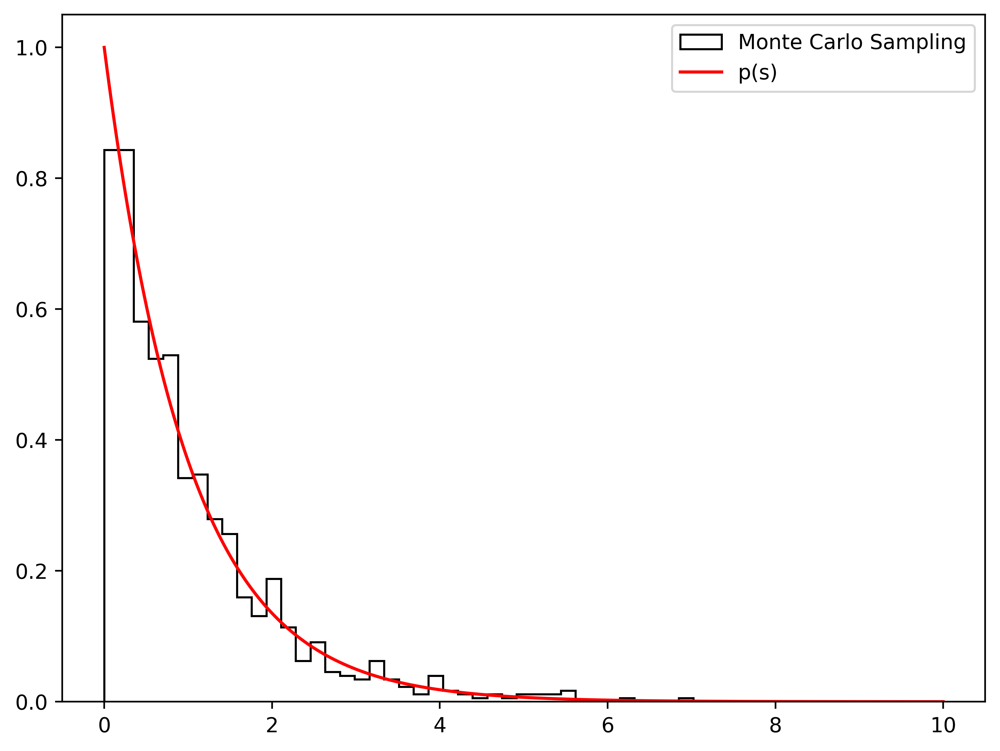

In [21]:
# Generate a sample of 1000 values using the Monte Carlo method
sample_s = [monte_carlos(p_s, 0, 10) for _ in range(1000)]

# Define a grid of x-values for plotting p(s)
x = np.linspace(0, 10, 10000)


# Plot the histogram and p(s) on the same plot
plt.hist(sample_s, bins=40, density=True, label='Monte Carlo Sampling', histtype='step', color='k')
plt.gcf().set_size_inches(8, 6)
plt.gcf().dpi = 500
plt.plot(x, p_s(x), label='p(s)',c='r')
plt.legend()
plt.show()

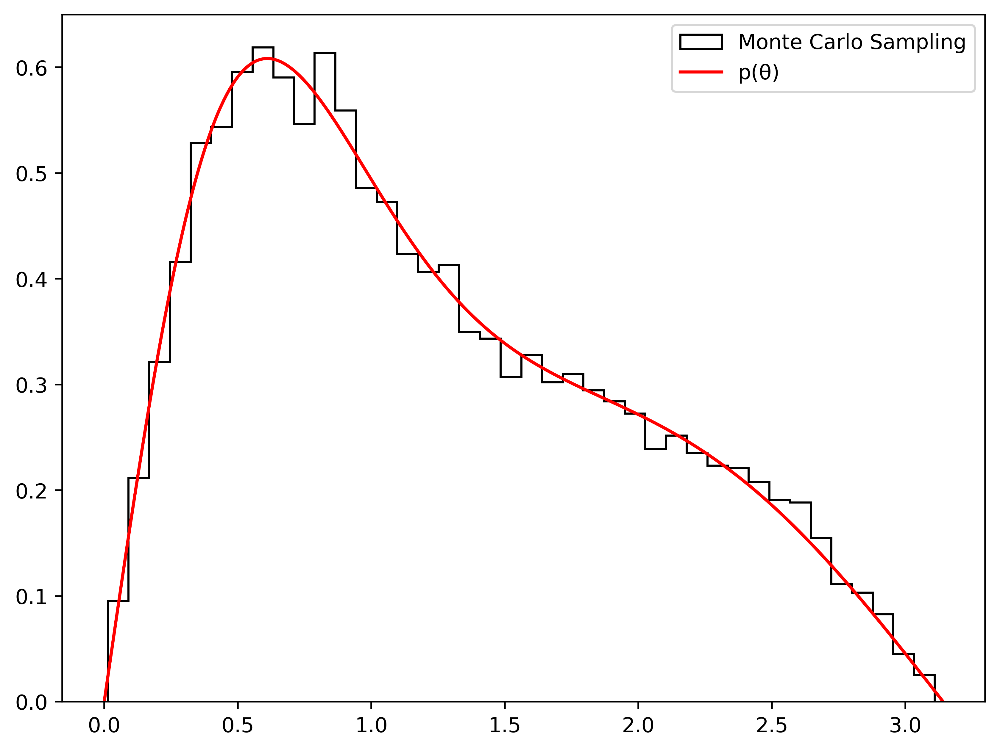

In [22]:
# Generate a sample of 1000 values using the Monte Carlo method
sample_theta = [monte_carlos(p_theta, 0, np.pi) for _ in range(10000)]

# Define a grid of x-values for plotting p(s)
x = np.linspace(0 , np.pi, 10000)


# Plot the histogram and p(s) on the same plot
plt.hist(sample_theta, bins=40, density=True, label='Monte Carlo Sampling', histtype='step', color='k')
plt.plot(x, p_theta(x), label='p(θ)',c='r')
plt.gcf().set_size_inches(8, 6)
plt.gcf().dpi = 500
plt.legend()
plt.show()

In [23]:
# Main algorithm
def path():
    depositions=[]
    E = [params['E']]
    theta,phi=[np.random.uniform(0,np.pi)],[np.random.uniform(0,2*np.pi)]
    # x=[np.array([0.2*params['s']*np.cos(np.random.uniform(0, 2*np.pi)),0.2*params['s']*np.sin(np.random.uniform(0, 2*np.pi)),0])]
    x=[np.array([0,0,np.random.uniform(0,params['z'])])]
    s=[monte_carlos(p_s,x_max=params['z'],p_max=p_s(0))]
    x.append(x[-1]+s[-1]*np.array([np.sin(theta[-1])*np.cos(phi[-1]),np.sin(theta[-1])*np.sin(phi[-1]),np.cos(theta[-1])]))
    while in_cylinder(x[-1],params['s'],params['z']):
        choice=np.random.choice(['compton','photoelectric'],p=[sigma_c(E[-1]*0.51)/(sigma_c(E[-1]*0.51)+sigma_pe(E[-1]*0.51)),sigma_pe(E[-1]*0.51)/(sigma_c(E[-1]*0.51)+sigma_pe(E[-1]*0.51))])
        if choice=='compton':
            # Scattering direction
            sc_phi=np.random.uniform(0,2*np.pi)
            sc_theta=monte_carlos(partial(p_theta,g=E[-1]),0,np.pi,p_max=np.max(p_theta(np.linspace(0,np.pi,10000),E[-1])))
            # Compotn scattering
            E.append(E[-1]/(1+E[-1]*(1-np.cos(sc_theta))))
            # New interaction point
            s.append(monte_carlos(p_s,x_max=params['z'],p_max=p_s(0)))
            theta.append(np.arccos(np.cos(theta[-1])*np.cos(sc_theta)+np.sin(theta[-1])*np.sin(sc_theta)*np.cos(sc_phi)))
            phi.append(phi[-1]+np.arcsin(np.sin(sc_theta)*np.sin(sc_phi)/np.sin(theta[-1])))
            x.append(x[-1]+s[-1]*np.array([np.sin(theta[-1])*np.cos(phi[-1]),np.sin(theta[-1])*np.sin(phi[-1]),np.cos(theta[-1])]))
            depositions.append(E[-2]-E[-1])
        else:
            E.append(0)
            depositions.append(E[-2]-E[-1])
            return {
            'E':E,
            'depositions':depositions,
            's':s,
            'x':x
        }
    x.pop(-1)
    return {
        'E':E,
        'depositions':depositions,
        's':s,
        'x':x
    }

In [24]:
# Run simulation
gammas=[path() for _ in range(params['N'])]

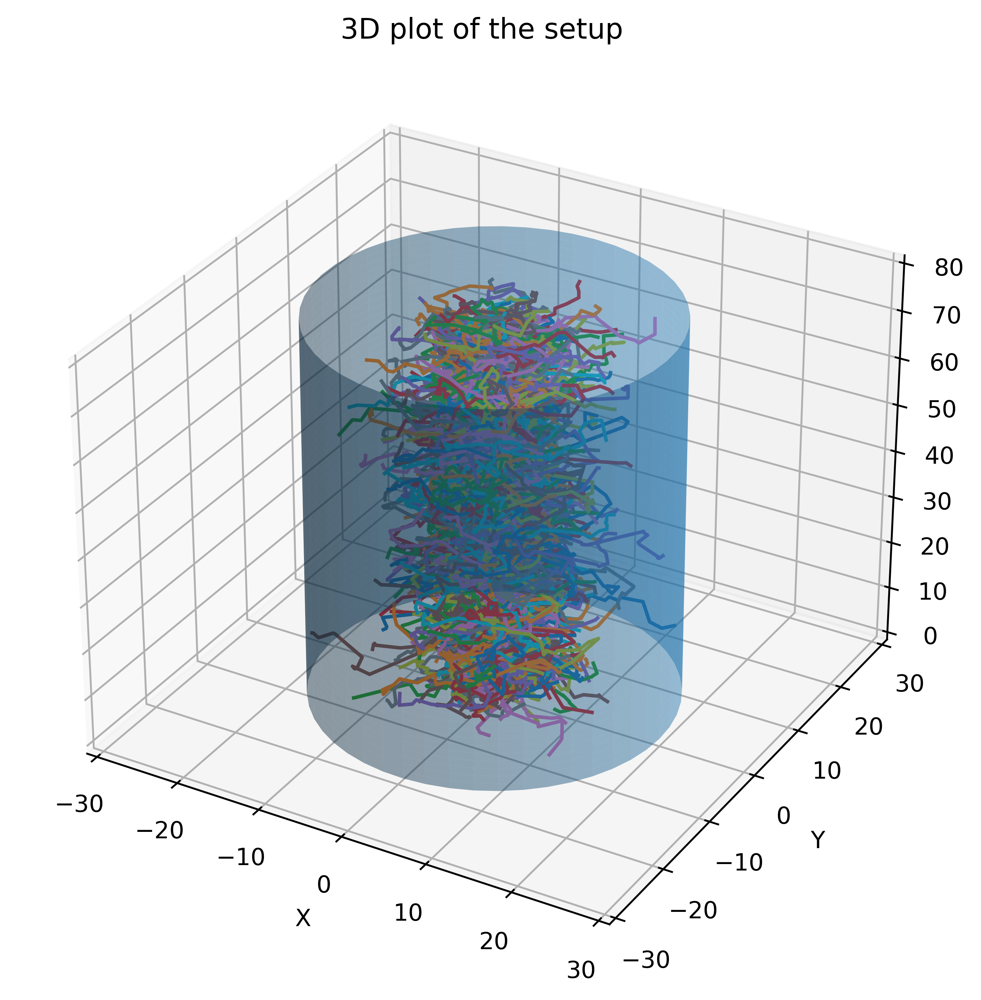

In [25]:
# Show 3D setup

# Define the larger cylinder coordinates
z = np.linspace(0, 80, 50)
theta = np.linspace(0, 2*np.pi, 50)
z, theta = np.meshgrid(z, theta)
r = 20
x = r*np.cos(theta)
y = r*np.sin(theta)

# Define the smaller cylinder coordinates
z_small = np.linspace(0, 80, 50)
theta_small = np.linspace(0, 2*np.pi, 50)
z_small, theta_small = np.meshgrid(z_small, theta_small)
r_small = 1
x_small = r_small*np.cos(theta_small)
y_small = r_small*np.sin(theta_small)

paths=[(np.array(gamma['x'])[:,0],np.array(gamma['x'])[:,1],np.array(gamma['x'])[:,2]) for gamma in gammas]
fig=plt.figure(figsize=(8,6),tight_layout=True)
ax=fig.add_subplot(1,1,1,projection ='3d')

# Create the 3D plot
ax.plot_surface(x, y, z, alpha=0.45)
# ax.plot_surface(x_small, y_small, z_small, alpha=0.7)
for path in paths: ax.plot3D(path[0],path[1],path[2])
# Set the axis labels and limits
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_xlim(-30, 30)
ax.set_ylim(-30, 30)
ax.set_zlim(0, 80)

# Show the plot
plt.gcf().set_size_inches(8, 6)
plt.gcf().dpi = 500
plt.title('3D plot of the setup')
plt.show()


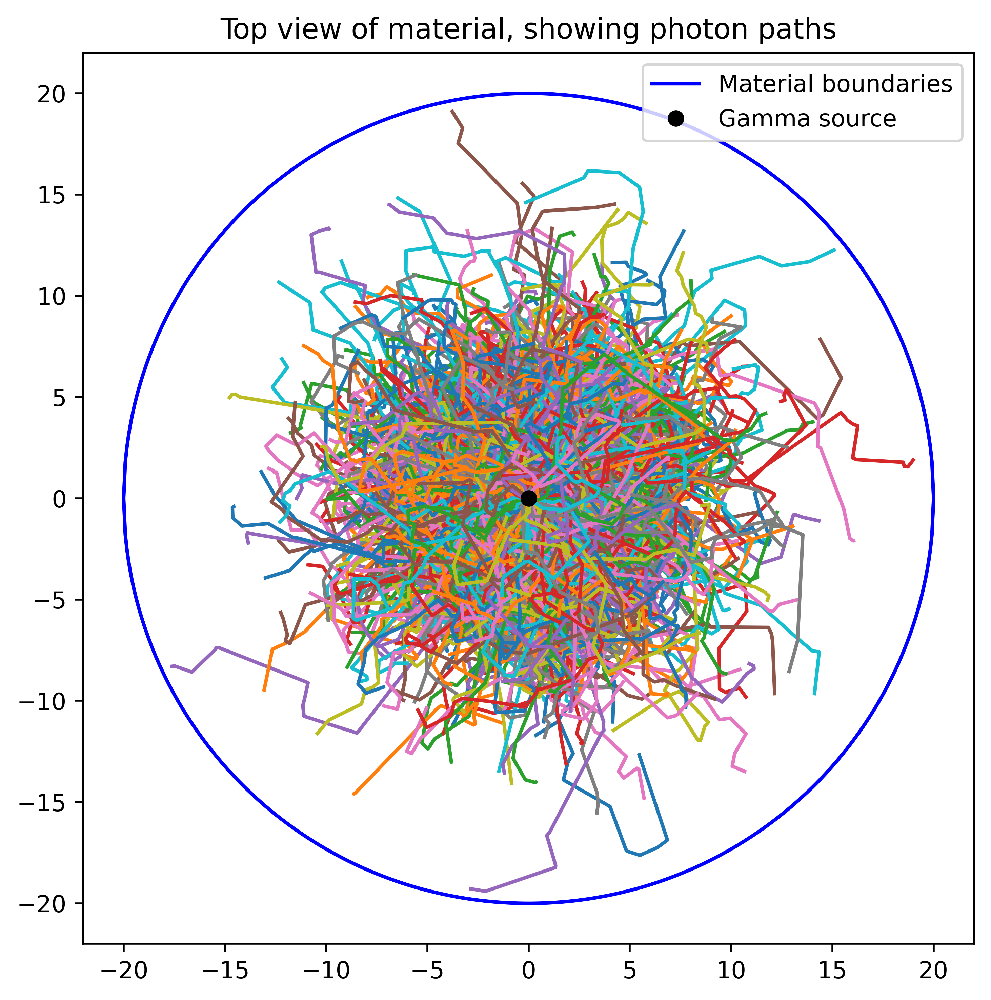

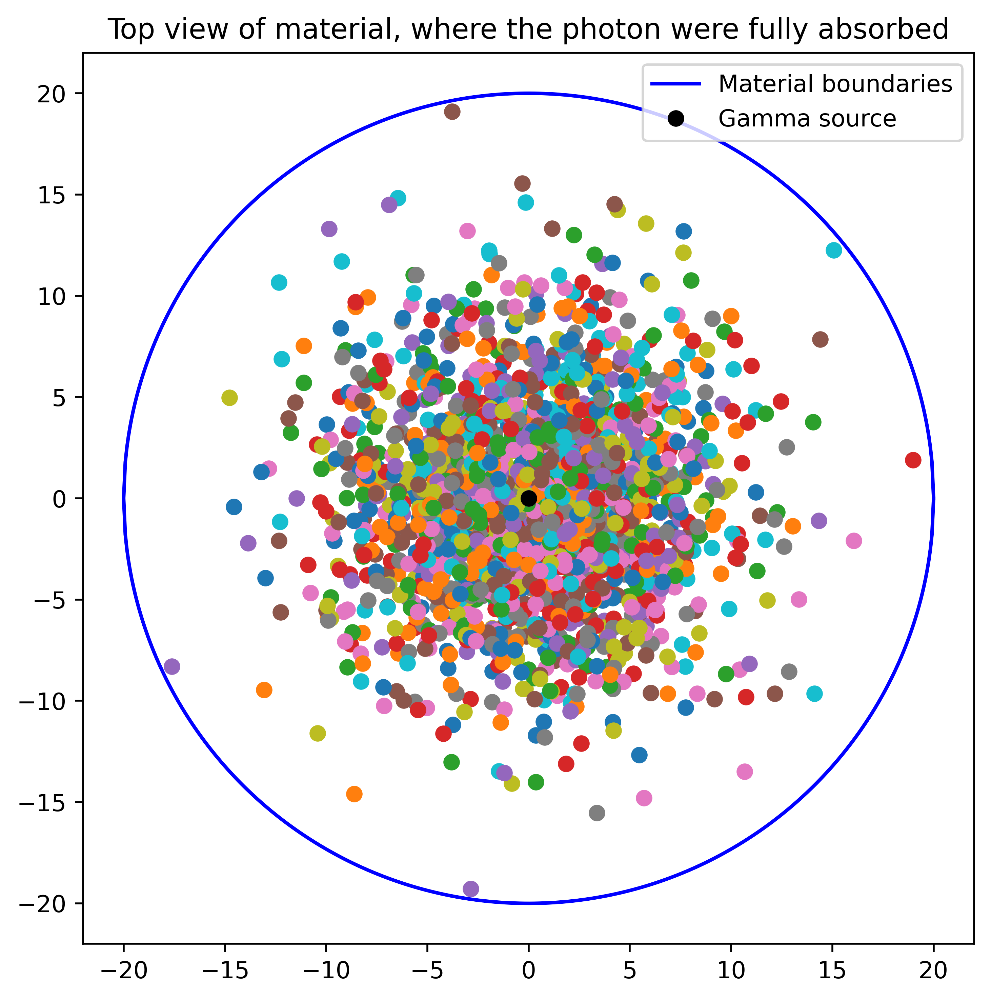

In [26]:
# Plot top view of material
paths=[(np.array(gamma['x'])[:,0],np.array(gamma['x'])[:,1]) for gamma in gammas]
fig=plt.figure(figsize=(8,6),tight_layout=True,facecolor='w')
ax=fig.add_subplot(1,1,1,aspect='equal')
for path in paths: ax.plot(path[0],path[1])
x=np.linspace(-params['s'],params['s'],500)
y=np.sqrt(params['s']**2-x**2)
ax.plot(x,y,'b', label='Material boundaries')
ax.plot(x,-y,'b')
ax.plot(0,0,'ko', label='Gamma source')
plt.gcf().set_size_inches(8, 6)
plt.gcf().dpi = 500
plt.legend()
plt.title('Top view of material, showing photon paths')
plt.show()

points=[(np.array(gamma['x'])[-1,0],np.array(gamma['x'])[-1,1]) for gamma in gammas]
fig=plt.figure(figsize=(8,6),tight_layout=True,facecolor='w')
ax=fig.add_subplot(1,1,1,aspect='equal')
for point in points: ax.plot(point[0],point[1],'o')
x=np.linspace(-params['s'],params['s'],500)
y=np.sqrt(params['s']**2-x**2)
ax.plot(x,y,'b', label='Material boundaries')
ax.plot(x,-y,'b')
ax.plot(0,0,'ko', label='Gamma source')
plt.gcf().set_size_inches(8, 6)
plt.gcf().dpi = 500
plt.title('Top view of material, where the photon were fully absorbed')
plt.legend()
plt.show()

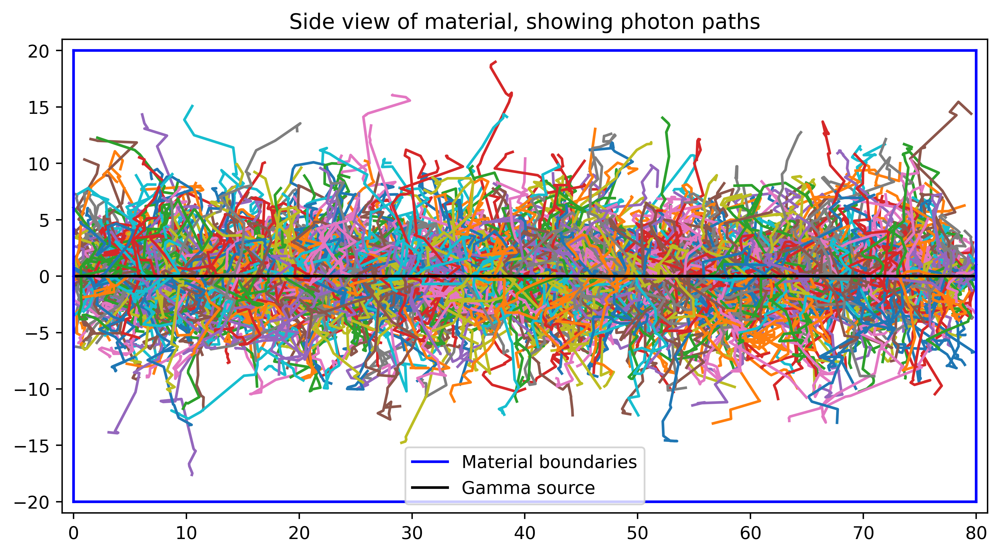

In [27]:
# Plot side view of material
paths=[(np.array(gamma['x'])[:,0],np.array(gamma['x'])[:,2]) for gamma in gammas]
fig=plt.figure(figsize=(8,6),tight_layout=True,facecolor='w')
ax=fig.add_subplot(1,1,1,aspect='equal')
for path in paths: ax.plot(path[1],path[0])
ax.set_xlim(-1,params['z']+1)
ax.set_ylim(-params['s']-1,params['s']+1)
ax.plot([0,params['z']],[params['s'],params['s']],'b', label='Material boundaries')
ax.plot([0,params['z']],[-params['s'],-params['s']],'b')
ax.plot([0,params['z']],[0,0],'k', label='Gamma source')

ax.plot([params['z'],params['z']],[-params['s'],params['s']],'b')
ax.plot([0,0],[-params['s'],params['s']],'b')
plt.title('Side view of material, showing photon paths')
plt.legend()
plt.gcf().set_size_inches(8, 6)
plt.gcf().dpi = 500
plt.show()

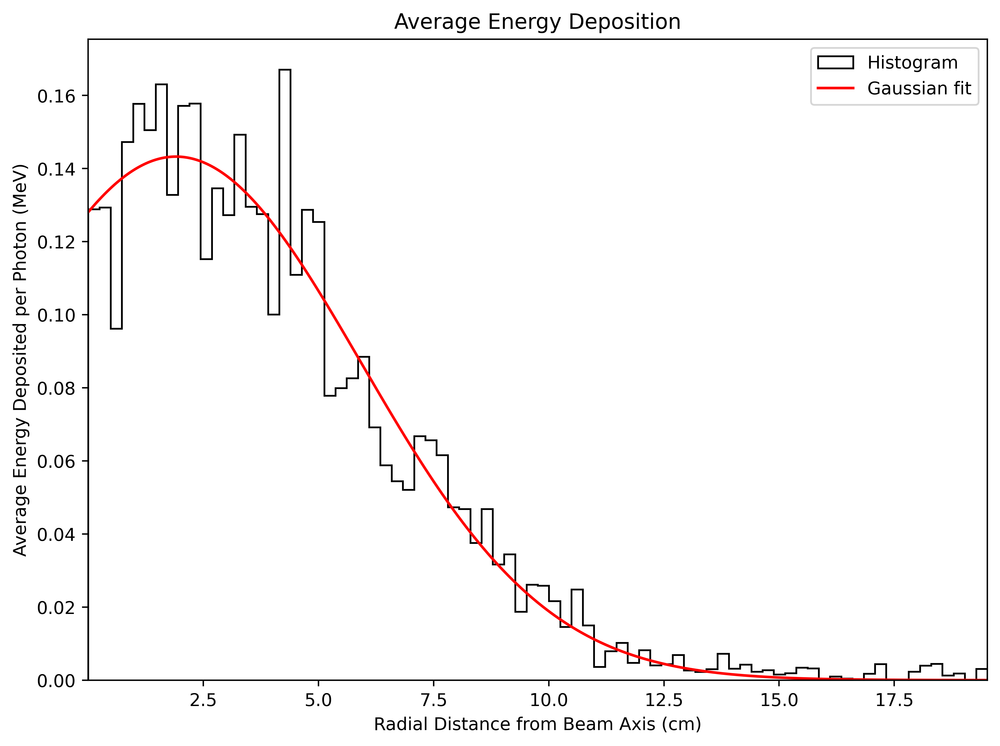

In [28]:
# Create a plot of the histogram with the fitted curves
def gaussian(x, mean, amplitude, standard_deviation):
    return amplitude * np.exp( - (x - mean)**2 / (2*standard_deviation ** 2))
def poisson(x, mean, amplitude):
    return amplitude * np.exp(-mean) * mean**x / factorial(x, exact=False)
# Define the z range for the histogram
# Extracting Energy deposition
# Initialize the arrays for energy depositions and x, y, z coordinates
E, x, y, z = [], [], [], []

# Populate the arrays by looping over the gammas
for gamma in gammas:
    E.extend(np.array(gamma['depositions']))
    x.extend(np.array(gamma['x'])[1:, 0])
    y.extend(np.array(gamma['x'])[1:, 1]) 
    z.extend(np.array(gamma['x'])[1:, 2])

# Convert the arrays to numpy arrays
E = np.array(E)
x = np.array(x)
y = np.array(y) 
z = np.array(z)
pt = np.sqrt(x**2 + y**2)
pt_min = 0
pt_max = params['s']
pt_bins = np.linspace(pt_min, pt_max + 1,len(pt)+1)
bins= 80
# Calculate the total energy deposition for each z bin
E_avg = []
for i in range(len(pt_bins) - 1):
    mask = (pt >= pt_bins[i]) & (pt < pt_bins[i+1])
    E_bin = E[mask]
    E_bin_avg = np.mean(E_bin) if len(E_bin) > 0 else 0
    E_avg.append(E_bin_avg)
E_avg = np.array(E_avg)/params['N']


bin_heights, bin_borders = np.histogram(pt, weights=E_avg, bins=bins,density=True)
bin_widths = np.diff(bin_borders)
bin_centers = bin_borders[:-1] + bin_widths / 2
popt_gaussian, _ = curve_fit(gaussian, bin_centers, bin_heights)
x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
fig = plt.figure(facecolor='w', figsize=(8,6), tight_layout=True)
plt.hist(pt, weights=E_avg, histtype='step', color='k', bins=bins, label='Histogram',density=True)
plt.xlabel('Radial Distance from Beam Axis (cm)')
plt.ylabel('Average Energy Deposited per Photon (MeV)')
plt.title('Average Energy Deposition')
plt.plot(x_interval_for_fit, gaussian(x_interval_for_fit, *popt_gaussian),label='Gaussian fit', c='red')
plt.legend()
plt.xlim(pt.min(), pt.max())
plt.gcf().set_size_inches(8, 6)
plt.gcf().dpi = 500
plt.show()